# SAYISAL GÖRÜNTÜ İŞLEME - YÜKSEK LİSANS 2025-2026 ARA SINAV PROJESİ 
# 244327019 - Arzu KOÇHAN

In [1]:
# 1.VERİ YÜKLEME
# 1.1. Kütüphanelerin içe aktarılması

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

print("OpenCV sürümü:", cv2.__version__)


OpenCV sürümü: 4.12.0


In [2]:
import sys, cv2
print("Python yolu:", sys.executable)
print("OpenCV sürümü:", cv2.__version__)


Python yolu: C:\Users\arzuk\anaconda3\anaconda3_new\envs\skin_env\python.exe
OpenCV sürümü: 4.12.0


In [3]:
# 1.2.Veri Setinin Yüklenmesi

base_dir = os.getcwd()
print("Çalışma dizini:", base_dir)

data_dir = os.path.join(
    base_dir,
    "skin_data",
    "Skin cancer ISIC The International Skin Imaging Collaboration"
)

train_dir = os.path.join(data_dir, "Train")
test_dir  = os.path.join(data_dir, "Test")

print("Veri ana klasörü   :", data_dir)
print("Train klasörü var mı?", os.path.exists(train_dir))
print("Test klasörü var mı? ", os.path.exists(test_dir))

print("Train içindeki sınıflar:")
print(os.listdir(train_dir))


Çalışma dizini: C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_proje
Veri ana klasörü   : C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_proje\skin_data\Skin cancer ISIC The International Skin Imaging Collaboration
Train klasörü var mı? True
Test klasörü var mı?  True
Train içindeki sınıflar:
['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


In [4]:
# Tüm resim yollarını ve etiketlerini yükleyen fonksiyon

VALID_EXT = (".jpg", ".jpeg", ".png")

def load_dataset(folder):
    image_paths = []
    labels = []
    
    for cls in sorted(os.listdir(folder)):
        cls_path = os.path.join(folder, cls)
        if not os.path.isdir(cls_path):
            continue
        
        for img_name in os.listdir(cls_path):
            if img_name.lower().endswith(VALID_EXT):
                full_path = os.path.join(cls_path, img_name)
                image_paths.append(full_path)
                labels.append(cls)
                
    df = pd.DataFrame({"image_path": image_paths, "label": labels})
    return df

# Train DataFrame oluşturuluyor
train_df = load_dataset(train_dir)

print("Toplam görüntü sayısı:", len(train_df))
train_df.head()
 

Toplam görüntü sayısı: 2239


,image_path,label
0,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis
1,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis
2,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis
3,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis
4,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis


In [5]:
# 1.3. Veri Özelliklerinin İncelenmesi

# Tek bir görüntünün özelliklerini döndüren fonksiyon
def get_image_info(path):
    img = cv2.imread(path)
    if img is None:
        return pd.Series({"height": np.nan, "width": np.nan, "channels": np.nan, "file_size_kb": np.nan})
    
    h, w = img.shape[:2]
    channels = img.shape[2] if img.ndim == 3 else 1
    size_kb = os.path.getsize(path) / 1024
    
    return pd.Series({"height": h, "width": w, "channels": channels, "file_size_kb": size_kb})

# Tüm DataFrame’e uygulama
info_df = train_df["image_path"].apply(get_image_info)

# Ana DF ile birleştirme
train_df = pd.concat([train_df, info_df], axis=1)

train_df.head()


,image_path,label,height,width,channels,file_size_kb
0,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis,450.0,600.0,3.0,254.826172
1,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis,450.0,600.0,3.0,305.413086
2,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis,450.0,600.0,3.0,287.517578
3,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis,450.0,600.0,3.0,266.640625
4,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis,450.0,600.0,3.0,254.510742


In [6]:
#1.3. Çözünürlük istatistikleri

print("Toplam görüntü sayısı:", len(train_df))
print("\nÇözünürlük istatistikleri:")
display(train_df[["height", "width"]].describe())


Toplam görüntü sayısı: 2239

Çözünürlük istatistikleri:


,height,width
count,2239.000000,2239.000000
mean,650.775346,862.062975
std,429.953857,576.232222
min,450.000000,576.000000
25%,450.000000,600.000000
50%,450.000000,600.000000
75%,768.000000,1024.000000
max,2592.000000,3872.000000


In [7]:
# 1.3. Kanal sayısı dağılımı (RGB mi, grayscale mi?)

print("\nKanal dağılımı (3 = RGB, 1 = grayscale):")
print(train_df["channels"].value_counts())



Kanal dağılımı (3 = RGB, 1 = grayscale):
channels
3.0    2239
Name: count, dtype: int64


In [8]:
#1.3. Dosya boyutu istatistikleri

print("\nDosya boyutu istatistikleri (KB):")
display(train_df["file_size_kb"].describe())



Dosya boyutu istatistikleri (KB):


count    2239.000000
mean      276.660945
std       197.133167
min        24.147461
25%       204.532227
50%       255.027344
75%       299.150879
max      3756.228516
Name: file_size_kb, dtype: float64

# Yorum

Veri seti yüksek çeşitlilik içermektedir (boyut, çözünürlük, dosya boyutu).Tüm görüntülerin RGB olması,renk tabanlı analizlerin yapılmasına olanak tanımaktadır. Çözünürlük ve dosya boyutundaki değişiklikler, ön işleme adımlarının (resize, normalize) gerekliliğine işaret etmektedir.Bu sonuçlar, veri setinin dengeli kanallara sahip olmakla birlikte sınıflar arasındaki dengesizlikler ileride model performansını etkileyebilir.


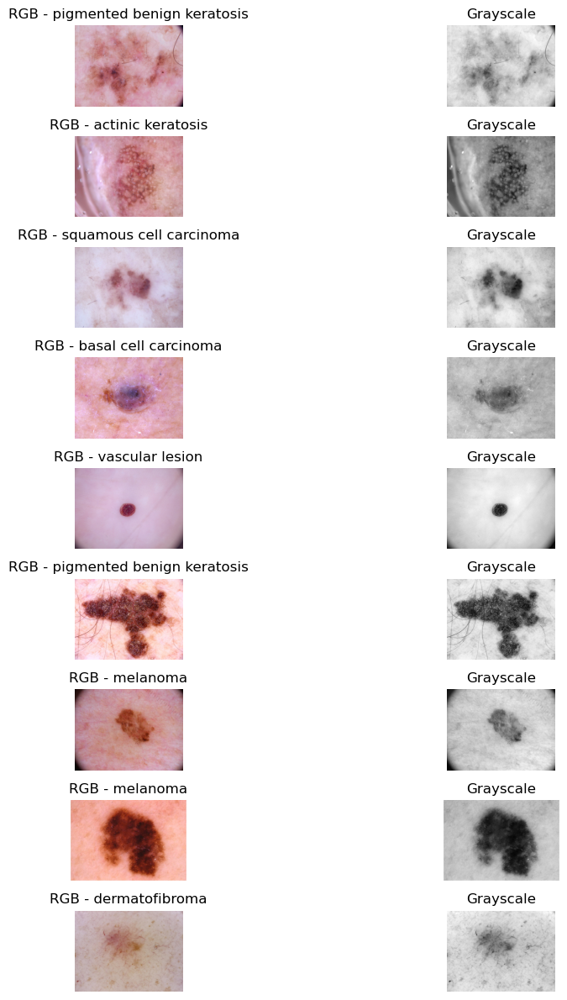

In [9]:
# 2.Görüntü Yükleme ve Görselleştirme

# 2.1.Rastgele 9 Görüntü Seçme ve Görselleştirme

sample_df = train_df.sample(9, random_state=42).reset_index(drop=True)

plt.figure(figsize=(12, 12))

for i in range(9):
    img_path = sample_df.loc[i, "image_path"]
    
    # RGB görüntüyü oku
    img_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    # Grayscale görüntü
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    # RGB göster
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(img_rgb)
    plt.title(f"RGB - {sample_df.loc[i, 'label']}")
    plt.axis("off")

    # Grayscale göster
    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(img_gray, cmap="gray")
    plt.title("Grayscale")
    plt.axis("off")

plt.tight_layout()
plt.show()



In [10]:
# 2.2. Rastgele Görüntülerin İstatistiksel Özellikleri
# Kod – Piksel İstatistikleri

def get_stats(img):
    return {
        "min": np.min(img),
        "max": np.max(img),
        "mean": np.mean(img),
        "std": np.std(img)
    }

stats_list = []

for i in range(9):
    img_path = sample_df.loc[i, "image_path"]

    img_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    stats_rgb = get_stats(img_rgb)
    stats_gray = get_stats(img_gray)

    stats_list.append({
        "image": img_path,
        "label": sample_df.loc[i, "label"],
        "rgb_min": stats_rgb["min"],
        "rgb_max": stats_rgb["max"],
        "rgb_mean": stats_rgb["mean"],
        "rgb_std": stats_rgb["std"],
        "gray_min": stats_gray["min"],
        "gray_max": stats_gray["max"],
        "gray_mean": stats_gray["mean"],
        "gray_std": stats_gray["std"],
    })

stats_df = pd.DataFrame(stats_list)
stats_df


,image,label,rgb_min,rgb_max,rgb_mean,rgb_std,gray_min,gray_max,gray_mean,gray_std
0,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,pigmented benign keratosis,0,228,170.942179,34.651189,0,215,167.198248,25.113234
1,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,actinic keratosis,36,255,167.671658,37.063767,65,255,163.538619,26.159099
2,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,squamous cell carcinoma,42,250,196.510733,27.549631,64,232,192.090530,25.355035
3,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,basal cell carcinoma,0,255,182.406542,35.345656,6,255,176.937785,25.395877
4,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,vascular lesion,12,233,188.665038,27.192421,36,213,182.293956,23.212077
5,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,pigmented benign keratosis,0,255,178.831396,68.916948,14,255,177.452478,62.821834
6,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,melanoma,0,233,154.734723,39.415346,2,202,152.565465,27.721538
7,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,melanoma,0,255,152.539896,71.658027,18,253,153.336670,59.315452
8,C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_p...,dermatofibroma,32,215,170.718399,21.799103,61,202,171.368407,14.897842


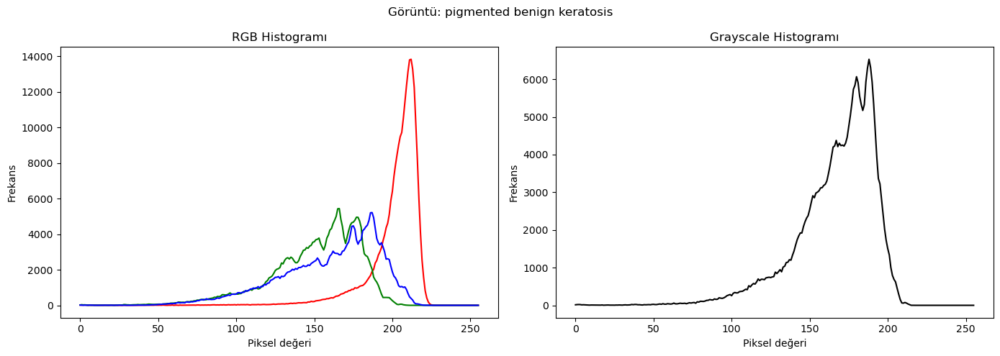

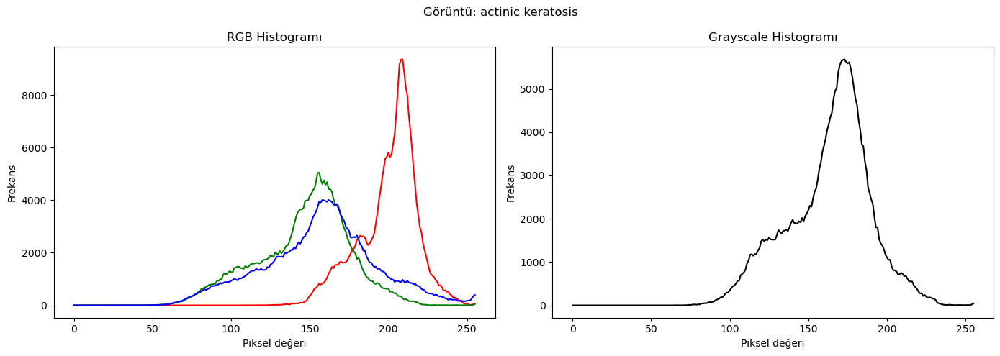

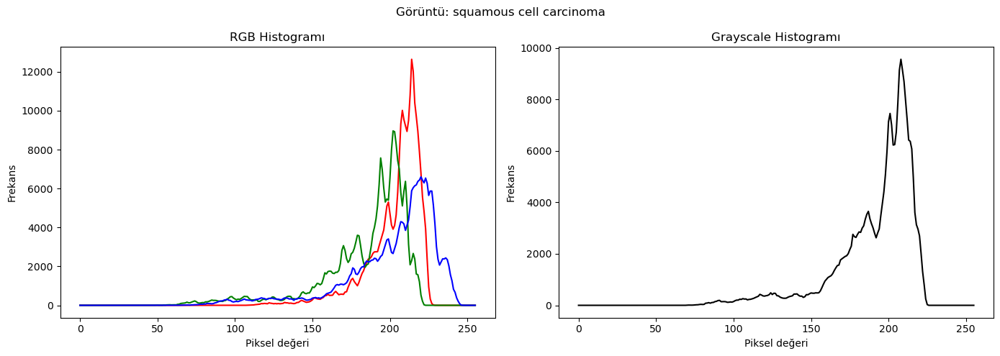

In [11]:
# 2.3. Histogram Çizimi (RGB + Gray)

for i in range(3):   # sadece 3 görüntü için histogram çizelim.
    img_path = sample_df.loc[i, "image_path"]
    img_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    plt.figure(figsize=(14, 5))

    # RGB Histogram 
    plt.subplot(1, 2, 1)
    colors = ('r', 'g', 'b')
    for j, col in enumerate(colors):
        hist = cv2.calcHist([img_rgb], [j], None, [256], [0, 256])
        plt.plot(hist, color=col)
    plt.title("RGB Histogramı")
    plt.xlabel("Piksel değeri")
    plt.ylabel("Frekans")

    # Grayscale Histogram 
    plt.subplot(1, 2, 2)
    hist_gray = cv2.calcHist([img_gray], [0], None, [256], [0, 256])
    plt.plot(hist_gray, color='black')
    plt.title("Grayscale Histogramı")
    plt.xlabel("Piksel değeri")
    plt.ylabel("Frekans")

    plt.suptitle(f"Görüntü: {sample_df.loc[i,'label']}")
    plt.tight_layout()
    plt.show()


# ANALİZ 

a) RGB histogramındaki üç kanal birbirinden nasıl ayrılıyor?

RGB histogramları incelendiğinde; kırmızı (R) kanalın genellikle daha geniş bir yoğunluk aralığına yayıldığı, yeşil (G) kanalın orta yoğunluklarda daha dengeli bir dağılım gösterdiği, mavi (B) kanalın ise daha düşük piksel değerlerinde yoğunlaştığı görülmektedir.Bu durum deri görüntülerinin biyolojik yapısı ile uyumludur; deri dokusunda kırmızı ve yeşil tonları baskındır, bu nedenle R ve G histogramları yüksek frekansa sahiptir. Mavi kanalın görece düşük seviyede kalması, melanin ve hemoglobin absorpsiyonunun mavi ışıkta daha yüksek olmasıyla ilişkilidir.

b) Grayscale histogramı hangi tonlarda yoğunlaşıyor?

Grayscale histogramları görüntüden görüntüye değişse de genel olarak; piksel değerlerinin orta–yüksek tonlarda (120–200) yoğunlaştığı,çok düşük değerlerdeki (0–50) frekansın oldukça sınırlı olduğu,lezyon bölgelerine karşılık gelen koyu tonlarda lokal yükselişler bulunduğu gözlemlenmiştir.Bu yapı, dermatolojik görüntülerde arka planın açık renkli,lezyonun ise daha koyu ve yoğun yapıda olmasından kaynaklanmaktadır.

c) RGB → grayscale dönüşümün histogram üzerindeki etkisini yorumlayın.

RGB’den grayscale’e dönüşüm, her kanalı eşit kullanmayan bir ağırlıklı ortalama işlemidir. Dolayısıyla, yeşil kanalın katkısı en yüksek olduğu için, grayscale histogramı genelde G kanalına daha yakın bir dağılım göstermektedir.R, G ve B’deki üç farklı tepe noktası tek bir yoğunluk eğrisine indirgenir.Kanal farklılıkları ortadan kalktığı için histogram daha dar, daha yoğun ve tek modlu bir yapıya dönüşür. Koyu lezyon bölgeleri grayscale histogramında ani düşüş veya yerel tepe noktaları olarak belirginleşir.


Seçilen görüntü: C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_proje\skin_data\Skin cancer ISIC The International Skin Imaging Collaboration\Train\nevus\ISIC_0000350.jpg
Sınıf: nevus


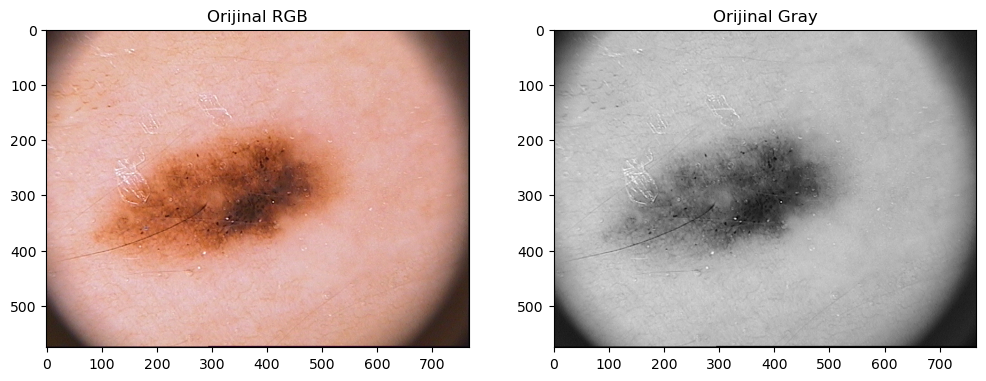

In [12]:
# 3. Görüntü İşleme ve İyileştirme
# Bir görüntü seçilmesi

sample = train_df.sample(1).iloc[0]
img_path = sample["image_path"]
label = sample["label"]

print("Seçilen görüntü:", img_path)
print("Sınıf:", label)

# RGB olarak yükleme
img_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

# Grayscale yükleme
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Orijinal RGB")

plt.subplot(1,2,2)
plt.imshow(img_gray, cmap="gray")
plt.title("Orijinal Gray")
plt.show()


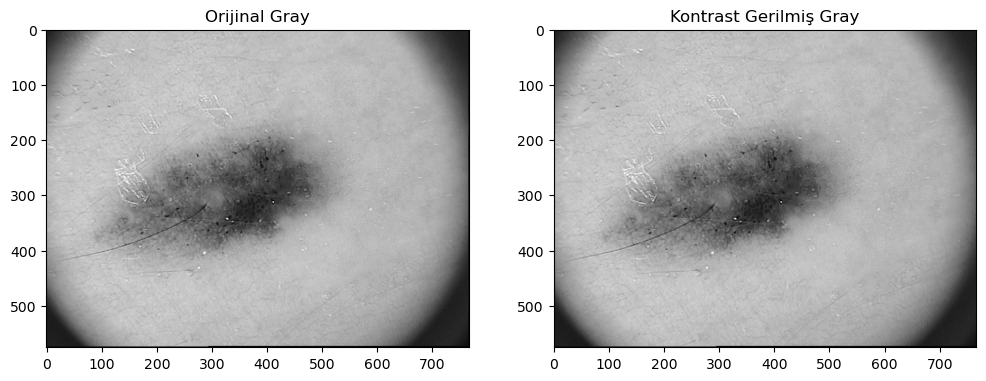

In [13]:
# 3.1. Grayscale kontrast germe

def contrast_stretch_gray(img):
    I_min, I_max = img.min(), img.max()
    stretched = ((img - I_min) / (I_max - I_min) * 255).astype(np.uint8)
    return stretched

gray_stretched = contrast_stretch_gray(img_gray)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_gray, cmap="gray")
plt.title("Orijinal Gray")

plt.subplot(1,2,2)
plt.imshow(gray_stretched, cmap="gray")
plt.title("Kontrast Gerilmiş Gray")
plt.show()


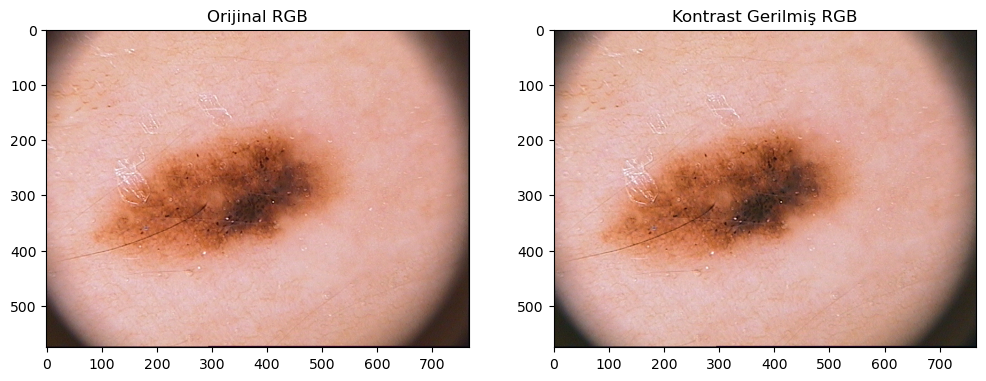

In [14]:
# 3.1. RGB kontrast germe (her kanal ayrı)

def contrast_stretch_rgb(img):
    stretched = np.zeros_like(img)
    for c in range(3):
        ch = img[:,:,c]
        stretched[:,:,c] = ((ch - ch.min()) / (ch.max() - ch.min()) * 255).astype(np.uint8)
    return stretched

rgb_stretched = contrast_stretch_rgb(img_rgb)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Orijinal RGB")

plt.subplot(1,2,2)
plt.imshow(rgb_stretched)
plt.title("Kontrast Gerilmiş RGB")
plt.show()


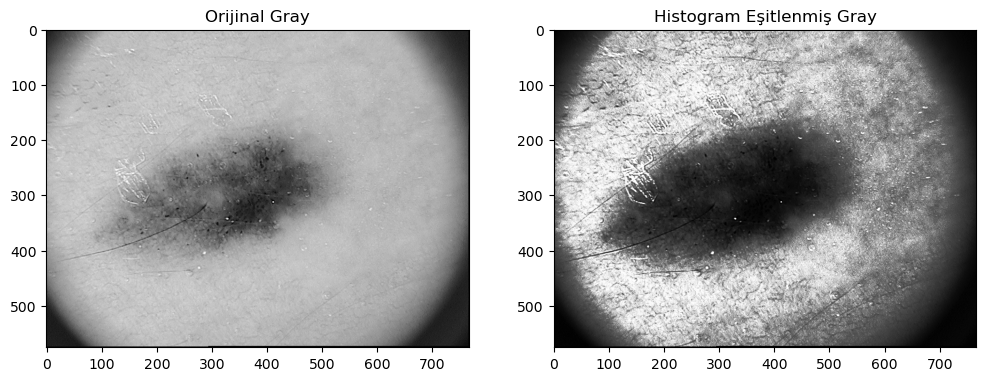

In [15]:
# 3.2. Histogram Eşitleme (Equalization)
# 3.2.1. Grayscale Equalization

gray_eq = cv2.equalizeHist(img_gray)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_gray, cmap='gray')
plt.title("Orijinal Gray")

plt.subplot(1,2,2)
plt.imshow(gray_eq, cmap='gray')
plt.title("Histogram Eşitlenmiş Gray")
plt.show()


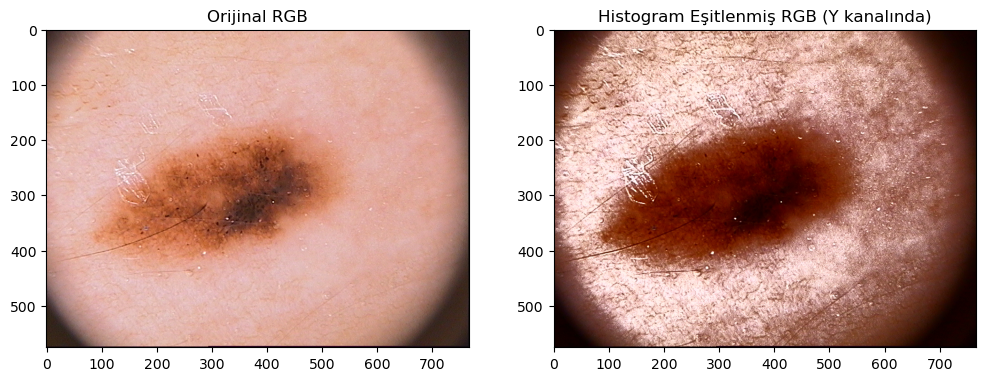

In [16]:
# 3.2.2. RGB — YCrCb üzerinde histogram eşitleme

def equalize_rgb(img):
    ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    y, cr, cb = cv2.split(ycrcb)

    y_eq = cv2.equalizeHist(y)

    ycrcb_eq = cv2.merge((y_eq, cr, cb))
    rgb_eq = cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2RGB)
    return rgb_eq

rgb_eq = equalize_rgb(img_rgb)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Orijinal RGB")

plt.subplot(1,2,2)
plt.imshow(rgb_eq)
plt.title("Histogram Eşitlenmiş RGB (Y kanalında)")
plt.show()


In [17]:
# 3.3. GAMMA DÜZELTME

def gamma_correction(img, gamma):
    gamma_table = np.array([(i/255)**gamma * 255 for i in range(256)]).astype(np.uint8)
    return cv2.LUT(img, gamma_table)



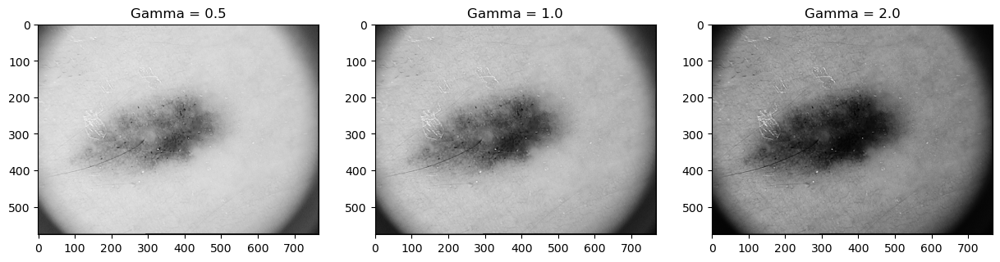

In [18]:
# 3.3. Grayscale gamma

gammas = [0.5, 1.0, 2.0]

plt.figure(figsize=(15,5))
for i, g in enumerate(gammas):
    corrected = gamma_correction(img_gray, g)
    plt.subplot(1,3,i+1)
    plt.imshow(corrected, cmap="gray")
    plt.title(f"Gamma = {g}")
plt.show()


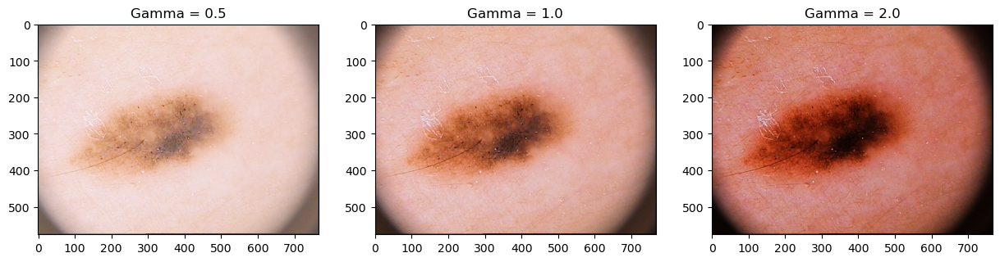

In [19]:
# 3.3. RGB gamma

plt.figure(figsize=(15,5))
for i, g in enumerate(gammas):
    corrected_rgb = gamma_correction(img_rgb, g)
    plt.subplot(1,3,i+1)
    plt.imshow(corrected_rgb)
    plt.title(f"Gamma = {g}")
plt.show()



# Yorum 

Hem RGB hem grayscale üzerinde kontrast germe işlemi, görüntünün dinamik aralığını genişletmiştir. Özellikle koyu bölgelerdeki ayrıntıların belirginleştiği, açık bölgelerde ise kontrastın arttığı gözlemlenmiştir. RGB’de her kanal ayrı işleme tabi tutulduğu için renk doygunluğu artmıştır.
Histogram Eşitleme; Grayscale eşitleme sonucu kontrastın arttığı fakat bazı bölgelerde gürültünün belirginleştiği görülmüştür.
RGB’de yalnızca luminance kanalı eşitlendiğinden renk bozulması engellenmiş, parlaklık dağılımı iyileştirilmiştir.Bu yöntem medikal görüntülerde detay koruyarak kontrast artırmak için daha güvenilirdir.
Gamma düzeltme, görüntü parlaklığını doğrusal olmayan biçimde değiştirdiği için farklı gamma değerleri görüntüde farklı tanısal özellikleri öne çıkarır. Gamma=0.5 görüntüyü aydınlatarak düşük parlaklık bölgelerinde ayrıntı görünürlüğünü artırsa da kontrast kaybına yol açar. Gamma=2.0 ise yüksek kontrast oluşturarak lezyon sınırlarının belirginleşmesini sağlar ancak koyu alanlarda ayrıntı kaybı yaratabilir. Bu nedenle, dermatolojik görüntü analizinde gamma değeri göreve göre seçilmelidir: gama=1.0 doğal temsil, gamma=2.0 kenar belirginleştirme için daha uygundur.



Seçilen görüntü: C:\Users\arzuk\OneDrive\Belgeler\skin_cancer_proje\skin_data\Skin cancer ISIC The International Skin Imaging Collaboration\Train\pigmented benign keratosis\ISIC_0025659.jpg
Etiket: pigmented benign keratosis


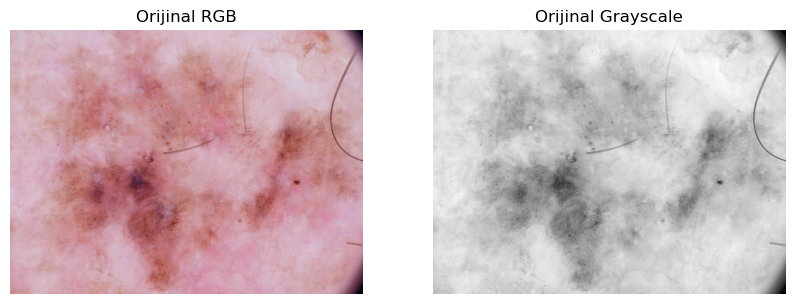

In [20]:
# 4. Gürültü Azaltma
# 4.1. Median Blur Uygulama

# 1 tane rastgele görüntü seçelim.
sample = train_df.sample(1, random_state=42).iloc[0]
img_path = sample["image_path"]
print("Seçilen görüntü:", img_path)
print("Etiket:", sample["label"])

# Görüntüyü yükleyip, RGB ve Grayscale'e çevirelim.
img_bgr  = cv2.imread(img_path)
img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Orijinal RGB ve Grayscale'i görelim
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.title("Orijinal RGB")
plt.imshow(img_rgb); plt.axis("off")

plt.subplot(1,2,2)
plt.title("Orijinal Grayscale")
plt.imshow(img_gray, cmap="gray"); plt.axis("off")

plt.show()


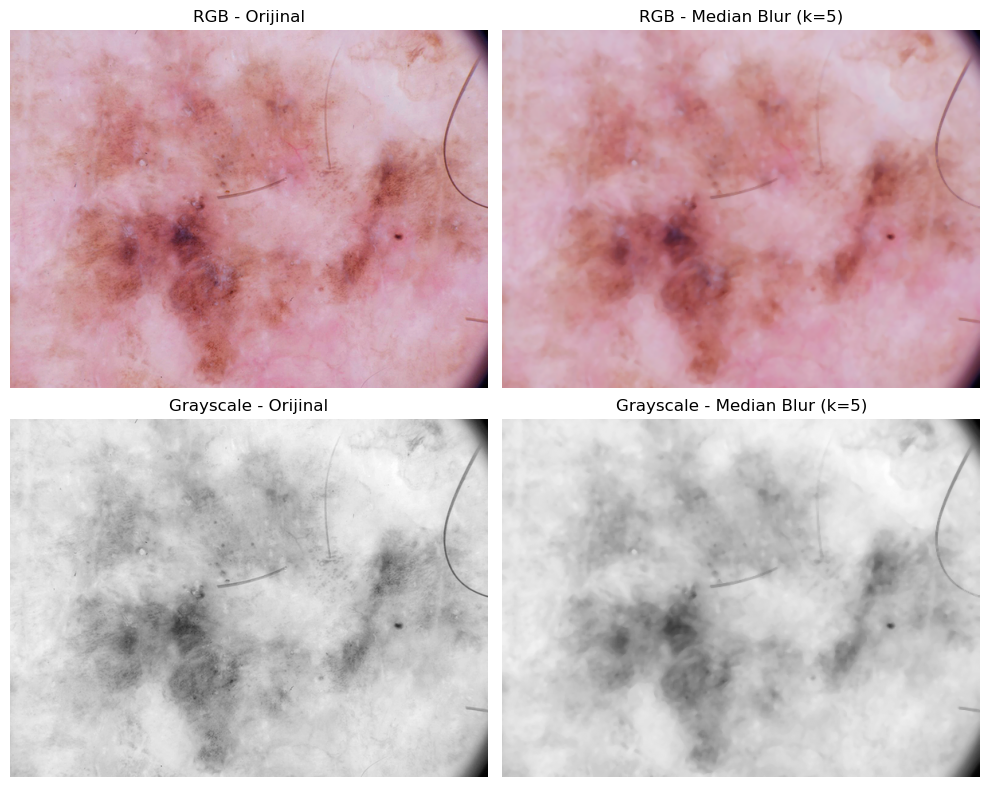

In [21]:

# 4.1. Median Blur Uygulama
# Kernel boyutu (tek sayı olmalı)

k = 5  # 3, 5, 7 gibi değerler kullanılabilir

median_rgb  = cv2.medianBlur(img_rgb,  k)
median_gray = cv2.medianBlur(img_gray, k)

plt.figure(figsize=(10,8))

plt.subplot(2,2,1)
plt.title("RGB - Orijinal")
plt.imshow(img_rgb); plt.axis("off")

plt.subplot(2,2,2)
plt.title(f"RGB - Median Blur (k={k})")
plt.imshow(median_rgb); plt.axis("off")

plt.subplot(2,2,3)
plt.title("Grayscale - Orijinal")
plt.imshow(img_gray, cmap="gray"); plt.axis("off")

plt.subplot(2,2,4)
plt.title(f"Grayscale - Median Blur (k={k})")
plt.imshow(median_gray, cmap="gray"); plt.axis("off")

plt.tight_layout()
plt.show()


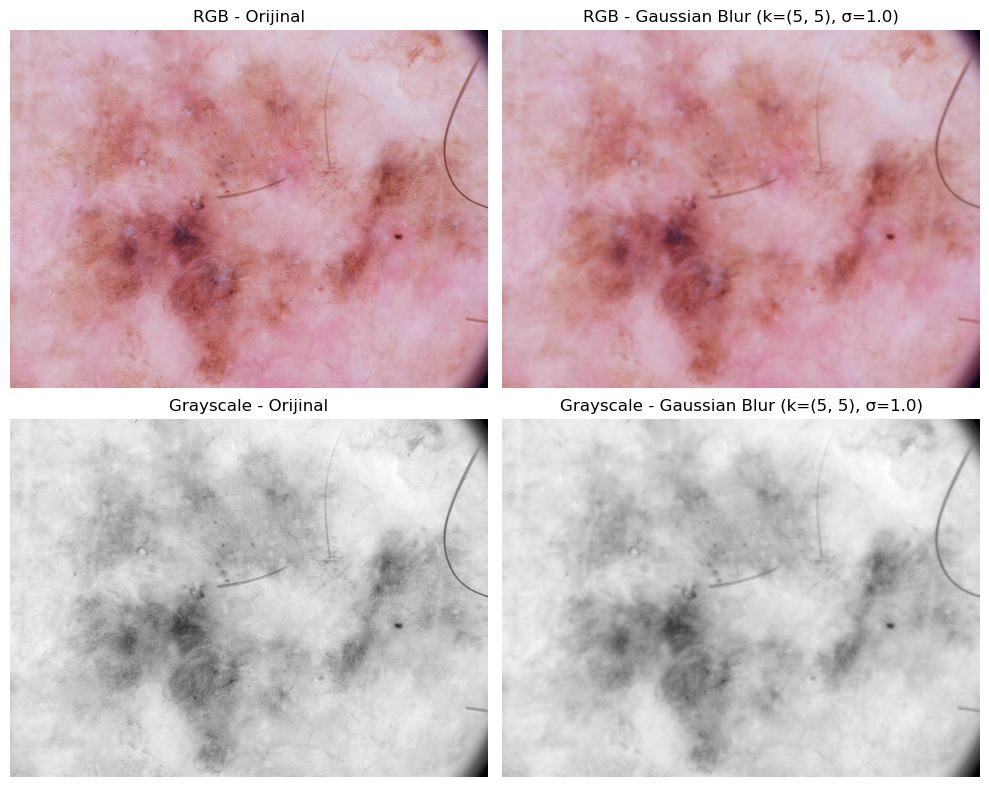

In [22]:
# 4.2. Gaussian Blur – RGB ve Grayscale
# Gaussian Blur için kernel ve sigma
k_gauss = (5,5)
sigma   = 1.0

gauss_rgb  = cv2.GaussianBlur(img_rgb,  k_gauss, sigmaX=sigma)
gauss_gray = cv2.GaussianBlur(img_gray, k_gauss, sigmaX=sigma)

plt.figure(figsize=(10,8))

plt.subplot(2,2,1)
plt.title("RGB - Orijinal")
plt.imshow(img_rgb); plt.axis("off")

plt.subplot(2,2,2)
plt.title(f"RGB - Gaussian Blur (k={k_gauss}, σ={sigma})")
plt.imshow(gauss_rgb); plt.axis("off")

plt.subplot(2,2,3)
plt.title("Grayscale - Orijinal")
plt.imshow(img_gray, cmap="gray"); plt.axis("off")

plt.subplot(2,2,4)
plt.title(f"Grayscale - Gaussian Blur (k={k_gauss}, σ={sigma})")
plt.imshow(gauss_gray, cmap="gray"); plt.axis("off")

plt.tight_layout()
plt.show()





4.3. Karşılaştırma 

a) Median blur, kenarları daha iyi korur mu?

Evet. Median filtre, pikselleri komşuluk içerisindeki medyan değere göre güncellediği için özellikle tuz-biber tipi gürültüyü etkili şekilde bastırırken, lezyon sınırları gibi ani parlaklık değişimlerini Gaussian filtreye göre daha iyi korur. Hem RGB hem grayscale görüntülerde, median blur sonrasında kenar çizgilerinin hâlâ belirgin olduğu; fakat küçük, izole parlak/karanlık noktaların azaldığı gözlenir.

b) Gaussian blur detay kaybına neden oluyor mu?

Gaussian blur, pikselleri ağırlıklı ortalama ile yumuşattığı için global olarak daha pürüzsüz bir görünüm sağlar, ancak bu işlemin doğal sonucu olarak ince detaylar ve keskin kenarlar yumuşar.Özellikle damar yapıları, ince doku çizgileri ve lezyon sınırlarının Gaussian blur sonrasında belirgin biçimde bulanıklaştığı, gri ton geçişlerinin daha homojen hâle geldiği görülür.Tıbbi görüntülerde aşırı Gaussian filtresi kullanımı tanısal açıdan önemli olabilecek mikro detayların kaybına yol açabileceği için dikkatli kullanılmalıdır.



In [23]:
# 5. Döndürme ve Ayna Çevirme (Flipping)
#5.1. Rastgele Döndürme (0–10 derece arası)
#Fonksiyon: Belirli açıyla döndürme

img_bgr = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

def rotate_image(image, angle):
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)  # scale = 1.0
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated



In [24]:
#0–10 derece arasında rastgele bir açı üretelim.
import random
angle = random.uniform(0, 10)
print("Seçilen rastgele açı:", angle)


Seçilen rastgele açı: 1.2575389670043646


In [25]:
#RGB ve Grayscale döndürme

rot_rgb = rotate_image(img_rgb, angle)
rot_gray = rotate_image(img_gray, angle)


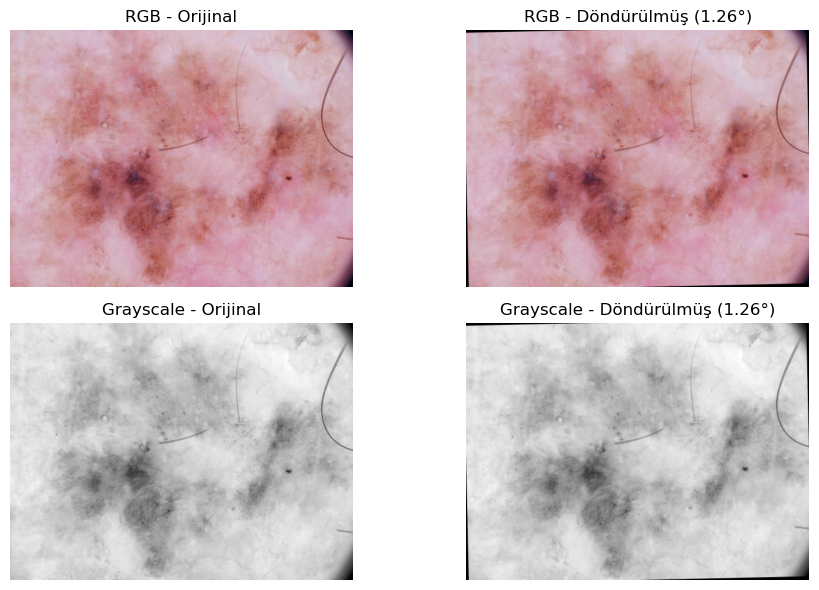

In [26]:
#Döndürülmüş görüntüleri gösterelim:

plt.figure(figsize=(10,6))

plt.subplot(2,2,1)
plt.title("RGB - Orijinal")
plt.imshow(img_rgb)
plt.axis("off")

plt.subplot(2,2,2)
plt.title(f"RGB - Döndürülmüş ({angle:.2f}°)")
plt.imshow(rot_rgb)
plt.axis("off")

plt.subplot(2,2,3)
plt.title("Grayscale - Orijinal")
plt.imshow(img_gray, cmap="gray")
plt.axis("off")

plt.subplot(2,2,4)
plt.title(f"Grayscale - Döndürülmüş ({angle:.2f}°)")
plt.imshow(rot_gray, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()


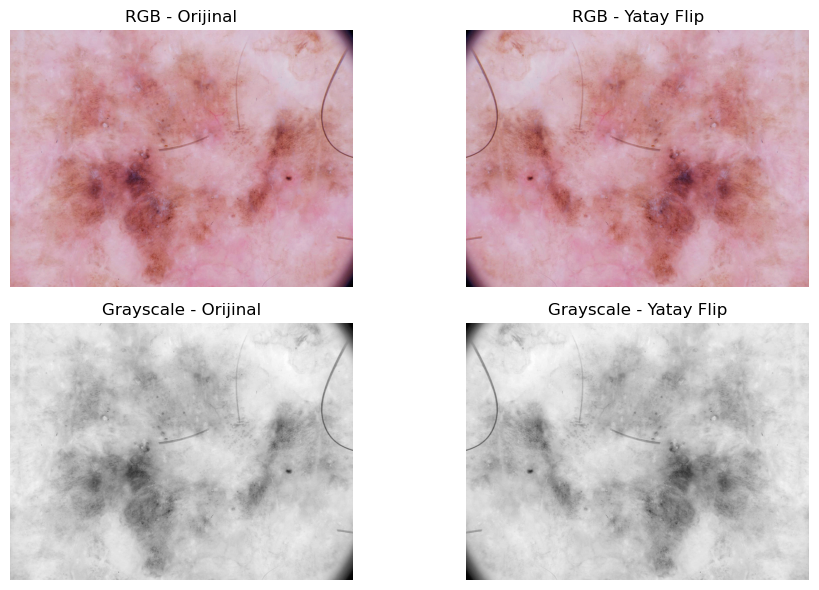

In [27]:
# 5.2. Yatay Ayna Çevirme 
# RGB ve Grayscale için flip işlemi

flip_rgb = cv2.flip(img_rgb, 1)   # 1 = yatay flip
flip_gray = cv2.flip(img_gray, 1)

# Flip sonuçlarını gösterelim

plt.figure(figsize=(10,6))

plt.subplot(2,2,1)
plt.title("RGB - Orijinal")
plt.imshow(img_rgb); plt.axis("off")

plt.subplot(2,2,2)
plt.title("RGB - Yatay Flip")
plt.imshow(flip_rgb); plt.axis("off")

plt.subplot(2,2,3)
plt.title("Grayscale - Orijinal")
plt.imshow(img_gray, cmap="gray"); plt.axis("off")

plt.subplot(2,2,4)
plt.title("Grayscale - Yatay Flip")
plt.imshow(flip_gray, cmap="gray"); plt.axis("off")

plt.tight_layout()
plt.show()


# Yorum 

Rastgele Döndürme: 0–10 derece arası düşük açılı dönüşler, görüntülerin doğal yapısını bozmaz.Tıbbi görüntülerde lezyonların yönüne duyarlı olmayan modeller için veri artırma sağlar.Rotasyon sonrası bazı kenarlarda boşluklar (siyah alanlar) oluşabilir; bu durum warpAffine matrisinin doğal sonucudur.

Yatay Ayna Çevirme: Lezyonların çoğunun simetrik yapıları olduğundan, yatay flip görüntü varyasyonunu artırarak model genellemesini iyileştirir.Flip işlemi RGB’de renk ilişkilerini; grayscale'de ise ton geçişlerini simetrik hâle getirir. 

In [28]:
# 6. Frekans Alanında Filtreleme (FFT)

img_bgr = cv2.imread(img_path) # path seçildi
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# 6.1. Fourier Dönüşüm

import numpy as np
import matplotlib.pyplot as plt
# FFT için float tipine çevir
gray = img_gray.astype(np.float32)

# 2D Fourier dönüşümü
F = np.fft.fft2(gray)

# Düşük frekansları merkeze taşımak için shift
F_shift = np.fft.fftshift(F)

# Genlik spektrumu (log ölçekli)
magnitude_spectrum = 20 * np.log(np.abs(F_shift) + 1e-8)



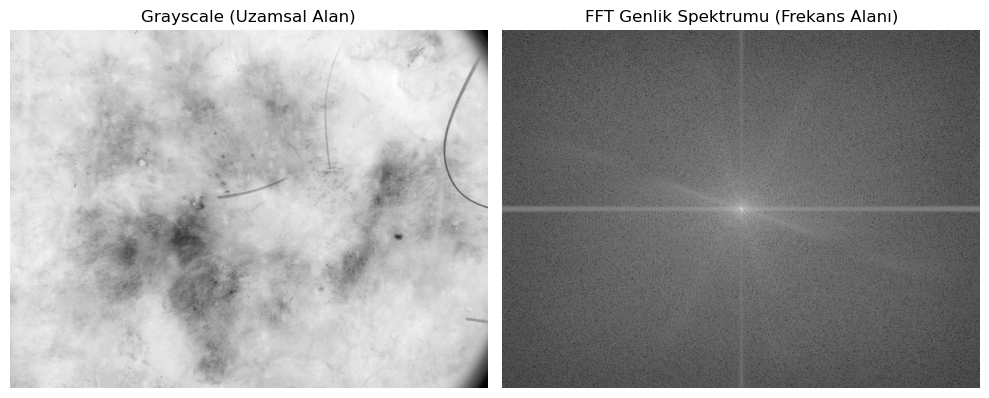

In [30]:
# Orijinal görüntü ve frekans spektrumu
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.title("Grayscale (Uzamsal Alan)")
plt.imshow(gray, cmap="gray")
plt.axis("off")

plt.subplot(1,2,2)
plt.title("FFT Genlik Spektrumu (Frekans Alanı)")
plt.imshow(magnitude_spectrum, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()

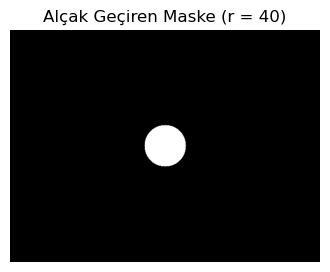

In [31]:
# 6.2. Alçak Geçiren Filtre Uygulama

rows, cols = gray.shape
crow, ccol = rows // 2, cols // 2  # merkez

# Tümü 0 olan maske
mask = np.zeros((rows, cols), np.uint8)

# Dairesel yarıçap (filtrenin kesim frekansı)
radius = 40  # istersen 20 / 60 / 80 diye oynayabilirsin

Y, X = np.ogrid[:rows, :cols]
distance2 = (X - ccol)**2 + (Y - crow)**2
mask[distance2 <= radius**2] = 1  # merkezde 1, çevrede 0

plt.figure(figsize=(4,4))
plt.title(f"Alçak Geçiren Maske (r = {radius})")
plt.imshow(mask, cmap="gray")
plt.axis("off")
plt.show()


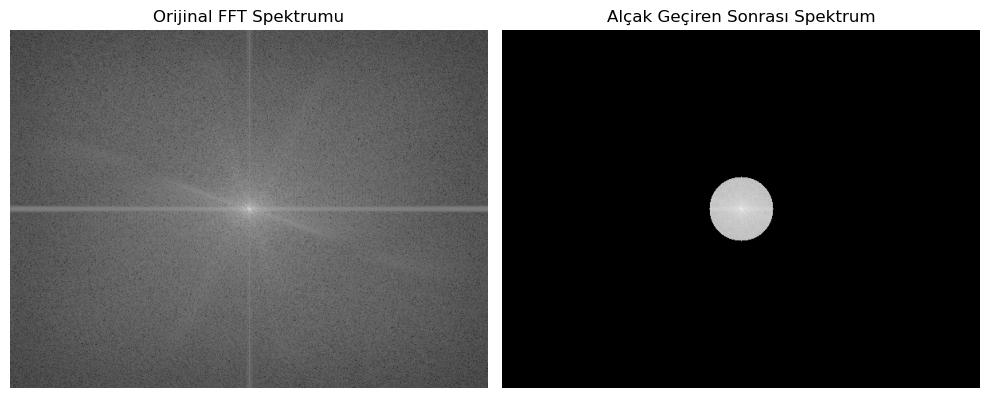

In [32]:
F_low = F_shift * mask  # eleman bazlı çarpma

# Filtrelenmiş frekans spektrumu (görselleştirme)
magnitude_low = 20 * np.log(np.abs(F_low) + 1e-8)

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.title("Orijinal FFT Spektrumu")
plt.imshow(magnitude_spectrum, cmap="gray")
plt.axis("off")

plt.subplot(1,2,2)
plt.title("Alçak Geçiren Sonrası Spektrum")
plt.imshow(magnitude_low, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()


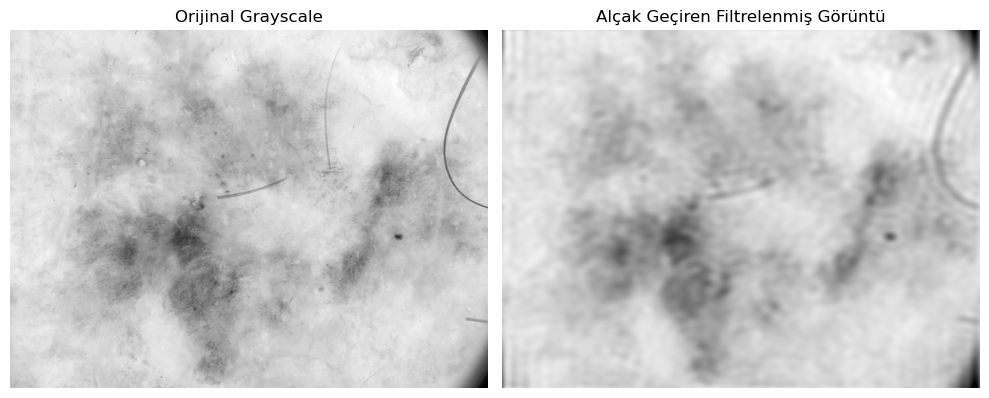

In [33]:
# 6.3. Ters Fourier (Inverse FFT)

# Shift'i geri al
F_ishift = np.fft.ifftshift(F_low)

# Ters Fourier dönüşümü
img_back_complex = np.fft.ifft2(F_ishift)

# Karmaşık çıktıyı mutlak değere çevir (sadece genlik)
img_back = np.abs(img_back_complex)

# Görselleştirme
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.title("Orijinal Grayscale")
plt.imshow(gray, cmap="gray")
plt.axis("off")

plt.subplot(1,2,2)
plt.title("Alçak Geçiren Filtrelenmiş Görüntü")
plt.imshow(img_back, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()


# 6.4. Karşılaştırma

Fourier dönüşümü, görüntüyü uzamsal alandan frekans alanına taşıyarak, görüntüdeki düşük frekanslı (yavaş değişen, düzgün bölgeler) ve yüksek frekanslı (kenarlar, detaylar, gürültü) bileşenleri ayrıştırmayı sağlar.
Grayscale görüntünün FFT genlik spektrumunda, merkeze yakın parlak bölgeler, görüntünün düşük frekans bileşenlerini (global parlaklık dağılımı, büyük yapı blokları) temsil eder.Kenarlara doğru uzanan daha sönük alanlar ise yüksek frekans bileşenlerini (kenarlar, ince damarlar, tüyler, doku ayrıntıları) gösterir.Dairesel alçak geçiren filtre (low-pass), spektrumun merkezindeki düşük frekansları geçirip, dış kısımdaki yüksek frekans bileşenlerini bastırır.Ters Fourier dönüşümü sonrası elde edilen görüntü, orijinal görüntüye göre daha yumuşak ve bulanık olup, ince doku detayları ve kenar keskinliği azalmıştır.Buna karşın, lezyonun genel şekli, konumu ve kaba parlaklık yapısı korunur; yani global yapı korunurken lokal detaylar bastırılmıştır. Dolayısıyla, FFT sonrası spektrum ile uzamsal görüntü karşılaştırıldığında, frekans alanında yapılan basit bir maskeleme işleminin uzamsal alanda bulanıklaştırma/gürültü azaltma etkisine karşılık geldiği gözlemlenmiştir.Bu tür frekans alanı filtreleme yaklaşımları, özellikle gürültünün yüksek frekans bileşeni baskın olduğu tıbbi görüntüleme problemlerinde, lezyon çevresindeki istenmeyen detayları azaltmak amacıyla kullanılabilmektedir.

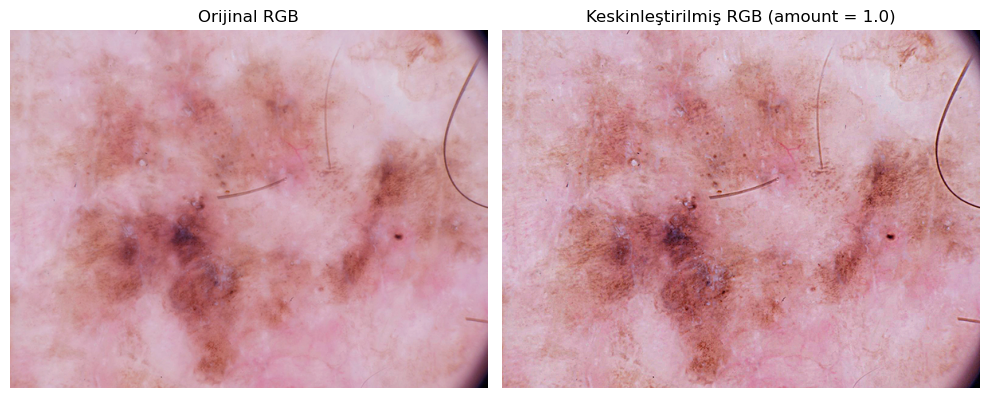

In [34]:
# 7. Keskinleştirme ve Enterpolasyon
# 7.1. Unsharp Masking ile Keskinleştirme

# Parametreler
blur_ksize = (9, 9)   
sigma = 3             
amount = 1.0          

# RGB görüntüyü blur'la
rgb_blur = cv2.GaussianBlur(img_rgb, blur_ksize, sigma)

# Unsharp keskinleştirme
sharp_rgb = cv2.addWeighted(img_rgb, 1 + amount, rgb_blur, -amount, 0)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.title("Orijinal RGB")
plt.imshow(img_rgb)
plt.axis("off")

plt.subplot(1,2,2)
plt.title(f"Keskinleştirilmiş RGB (amount = {amount})")
plt.imshow(sharp_rgb)
plt.axis("off")

plt.tight_layout()
plt.show()


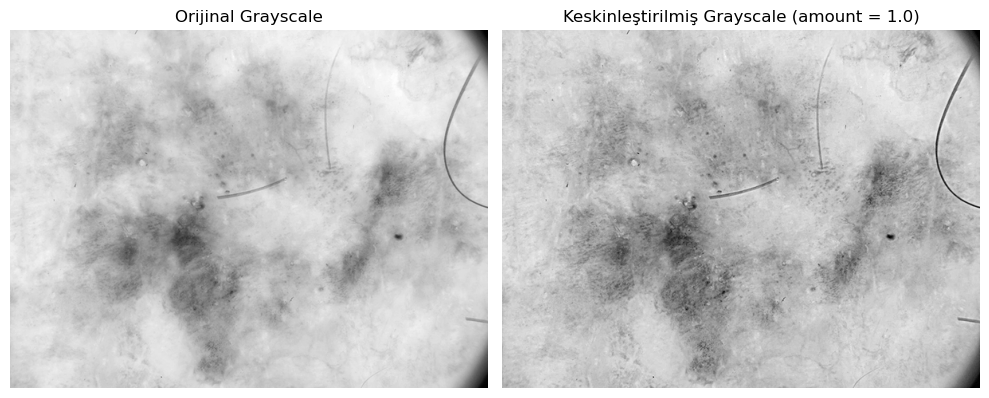

In [35]:
# Grayscale görüntü için Gaussian blur
gray_blur = cv2.GaussianBlur(img_gray, blur_ksize, sigma)

# Unsharp masking
sharp_gray = cv2.addWeighted(img_gray, 1 + amount, gray_blur, -amount, 0)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.title("Orijinal Grayscale")
plt.imshow(img_gray, cmap="gray")
plt.axis("off")

plt.subplot(1,2,2)
plt.title(f"Keskinleştirilmiş Grayscale (amount = {amount})")
plt.imshow(sharp_gray, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()


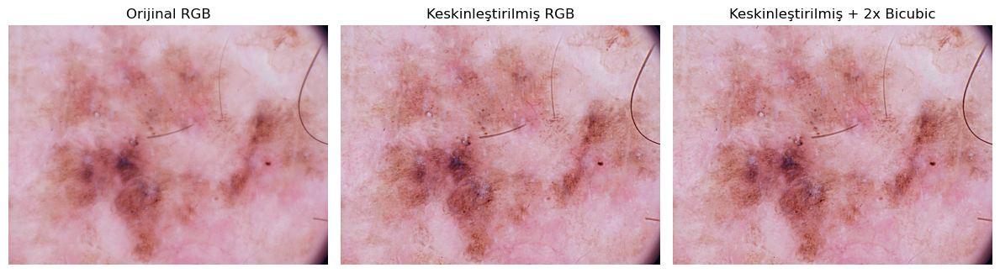

In [36]:
# 7.2. Bicubic Enterpolasyon

# Yükseklik-genişlik bilgisi
h, w = sharp_rgb.shape[:2]

# 2x büyütme (bicubic)
sharp_rgb_2x = cv2.resize(
    sharp_rgb,
    (w * 2, h * 2),
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.title("Orijinal RGB")
plt.imshow(img_rgb)
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Keskinleştirilmiş RGB")
plt.imshow(sharp_rgb)
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Keskinleştirilmiş + 2x Bicubic")
plt.imshow(sharp_rgb_2x)
plt.axis("off")

plt.tight_layout()
plt.show()


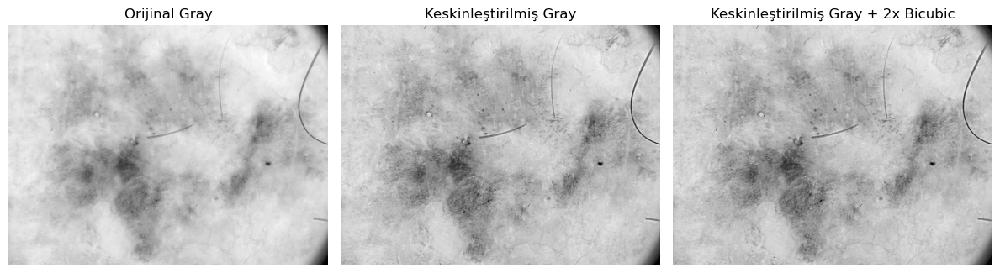

In [37]:
# Keskinleştirilmiş RGB’yi 2x büyütüyoruz

hg, wg = sharp_gray.shape

sharp_gray_2x = cv2.resize(
    sharp_gray,
    (wg * 2, hg * 2),
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.title("Orijinal Gray")
plt.imshow(img_gray, cmap="gray")
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Keskinleştirilmiş Gray")
plt.imshow(sharp_gray, cmap="gray")
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Keskinleştirilmiş Gray + 2x Bicubic")
plt.imshow(sharp_gray_2x, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()


# YORUM

Unsharp masking (keskinleştirme):
Hem RGB hem de grayscale görüntülerde yüksek frekans bileşenlerini (kenarlar, ince detaylar) güçlendirerek lezyon sınırlarını daha belirgin hâle getirmiştir.RGB görüntüde özellikle renk geçişleri daha keskin görünmekte, lezyonun çevre deri ile olan kontrastı artmaktadır.Grayscale görüntüde doku yapısı ve lezyon sınırı daha net algılanırken, gölgeli bölgelerdeki gürültü ve pütürlü yapı da bir miktar artmıştır. Bu, unsharp masking’in doğal yan etkisidir.

Bicubic enterpolasyon (2x büyütme):
Bicubic enterpolasyon, en yakın komşu (nearest) veya bilinear enterpolasyona göre daha yumuşak ve görsel olarak tatmin edici bir büyütme sağlar.Keskinleştirilmiş görüntü 2 kat büyütüldüğünde:Lezyonun şekli ve ana yapısı korunmakta,Kenarlar, unsharp sayesinde hâlâ belirgin görünmekte,
Ancak orijinal çözünürlükten daha fazla detay üretilmediği için, yakın bakışta bazı bölgelerde hafif yumuşama veya “suni” pürüzsüzlük hissi oluşabilmektedir.Grayscale 2x bicubic sonuçlarında, gri ton geçişleri nispeten sürekli ve doğal, ancak çok ince damar/tüy detayları kısmen kaybolmuş ya da yumuşamıştır.Özetle,Unsharp masking, lezyon sınırlarının ve doku detaylarının vurgulanması açısından etkili; ancak gürültüyü de beraberinde büyütüyor.Bicubic enterpolasyon, keskinleştirilmiş görüntüleri büyütürken görsel olarak tatmin edici bir kalite sunuyor; fakat gerçek detay eklemediği için, yüksek büyütmelerde yumuşama ve yapaylık hissi oluşabiliyor.